## ***Image Classification***

- In this project, i have select **computer vision** problem which is **image classification**. Image classification is a fundamental task in computer vision, where the goal is to assign a label to an input image based on its visual content.

- Image classification model capable of accurately categorizing images into predefined classes.  To achieve this goal, we explore different approaches: training a model from scratch using **Convolutional Neural Networks (CNNs)** and use **transfer learning**, a powerful technique in deep learning that leverages pre-trained models to tackle new tasks with limited data.

- **Fine-tuning** involves unfreezing some of the top layers of the pre-trained model and retraining the entire network with a lower learning rate.


- **Used Model**  To train the dataset, we used three different models, namely MobileNetV2, ResNet50, and ResNet101, in addition to training from scratch using Convolutional Neural Networks (CNN).

### ***Import Packages***

In [ ]:

# import data handling tools
import cv2
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels


# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras import regularizers

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

### ***Loading the data***
### **Dataset**
- For this project, I collected a unique dataset consisting of four distinct categories: cars, buses, motorbikes, and trucks. Using Google search, I gathered images relevant to each category, downloading a hundred images per category. In total, the dataset comprises 400 images.

In [15]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/drive/MyDrive/CustomDataset',
    image_size=(224, 224),
    batch_size=32,
    validation_split=0.3,
    subset="training",
    seed=42
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/drive/MyDrive/CustomDataset',
    image_size=(224, 224),
    batch_size=32,
    validation_split=0.3,
    subset="validation",
    seed=42
)


Found 400 files belonging to 4 classes.
Using 280 files for training.
Found 400 files belonging to 4 classes.
Using 120 files for validation.


### ***Plot some images from the dataset***

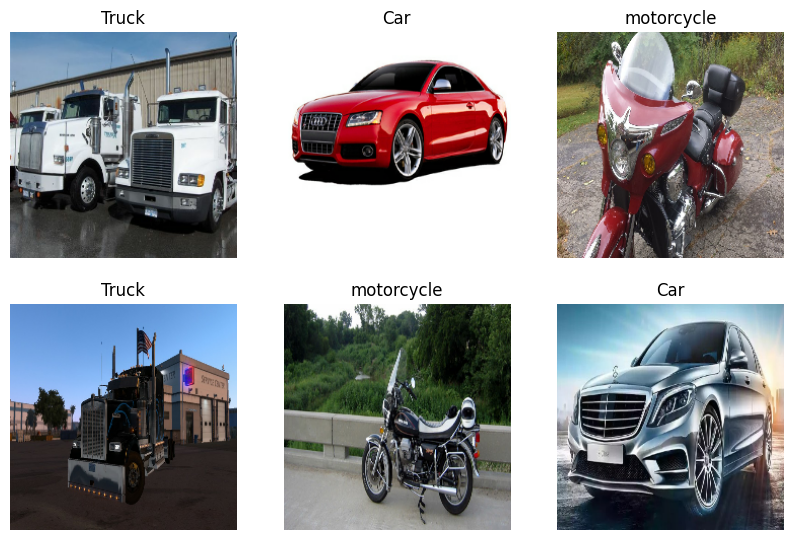

In [ ]:
class_names = train_ds.class_names

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(6):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()


### ***Train CNN from scratch***
- **Convolutional Neural Networks** (CNNs) are a class of deep neural networks primarily designed to process and analyze visual data.

In [ ]:
# Build the model
model = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.Conv2D(64, 3, padding="same", activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(64, 3, padding="same", activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(128, 3, padding="same", activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(128, 3, padding="same", activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(256, 3, padding="same", activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.7),  # regularization
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.7),  # regularization
    tf.keras.layers.Dense(4, activation='softmax')
])

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy'])



In [ ]:
# Train the model
history = model.fit(
    train_ds,
    epochs=20,
    batch_size=64,
    validation_data=val_ds
)

Epoch 1/20
9/9 [==============================] - 28s 385ms/step - loss: 1.4083 - accuracy: 0.2821 - val_loss: 1.3825 - val_accuracy: 0.2667
Epoch 2/20
9/9 [==============================] - 7s 314ms/step - loss: 1.3891 - accuracy: 0.2571 - val_loss: 1.3835 - val_accuracy: 0.2500
Epoch 3/20
9/9 [==============================] - 8s 297ms/step - loss: 1.3891 - accuracy: 0.2429 - val_loss: 1.3833 - val_accuracy: 0.3750
Epoch 4/20
9/9 [==============================] - 7s 300ms/step - loss: 1.3841 - accuracy: 0.2536 - val_loss: 1.3769 - val_accuracy: 0.3500
Epoch 5/20
9/9 [==============================] - 7s 296ms/step - loss: 1.3554 - accuracy: 0.3321 - val_loss: 1.2816 - val_accuracy: 0.4917
Epoch 6/20
9/9 [==============================] - 8s 316ms/step - loss: 1.2833 - accuracy: 0.4179 - val_loss: 1.1735 - val_accuracy: 0.4583
Epoch 7/20
9/9 [==============================] - 7s 374ms/step - loss: 1.2608 - accuracy: 0.4071 - val_loss: 1.1605 - val_accuracy: 0.4667
Epoch 8/20
9/9 [===

#### ***Accuracy***

In [ ]:
# Evaluate the model
test_loss, test_accuracy = model.evaluate(val_ds)

# Print the test accuracy
print("Val Accuracy:", test_accuracy)


4/4 [==============================] - 3s 34ms/step - loss: 0.7572 - accuracy: 0.6750
Val Accuracy: 0.675000011920929


#### ***Plot the accuracies and losses***

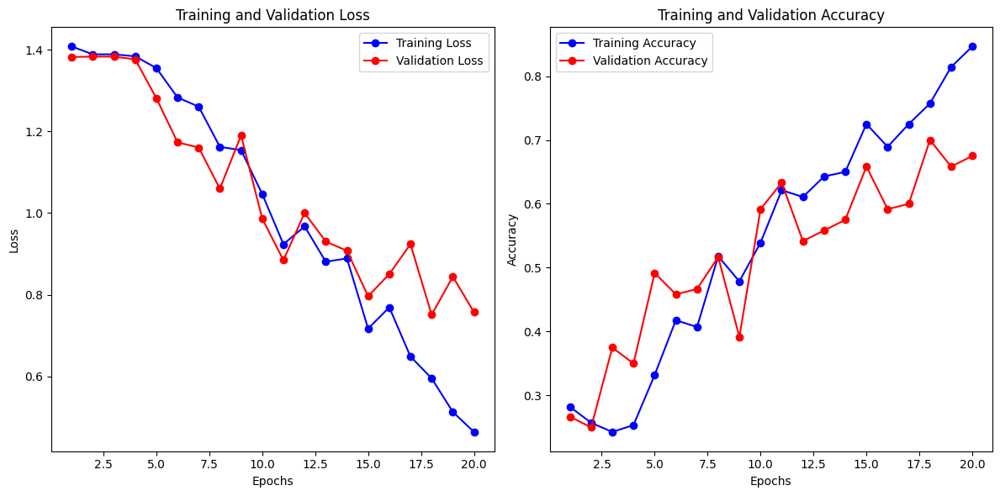

In [ ]:
import matplotlib.pyplot as plt

# Get training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(train_loss) + 1)

# Plot losses
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot accuracies
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


#### ***Confusion Matrix***

1/1 [==============================] - 0s 152ms/step


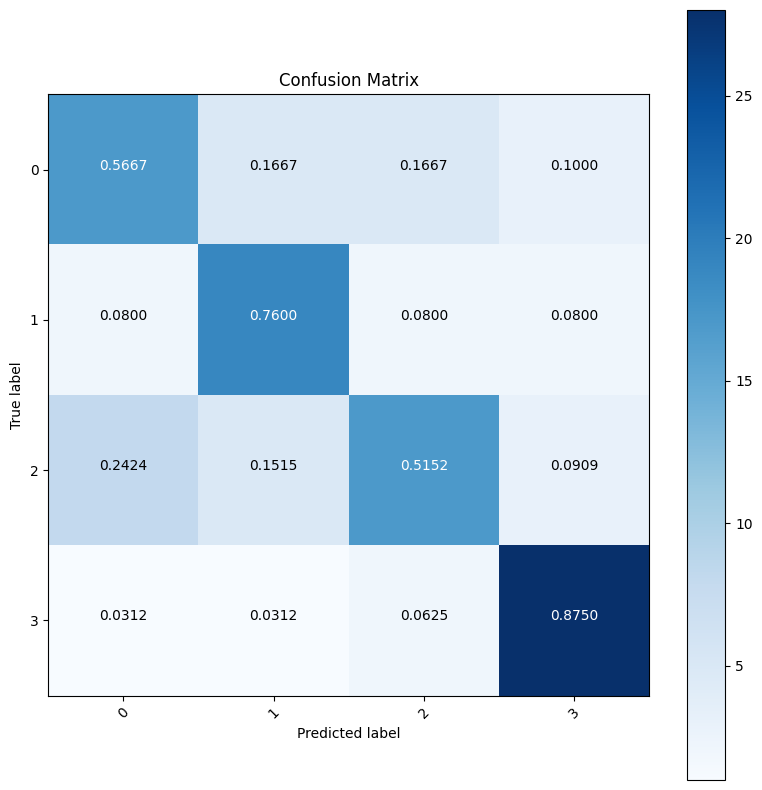

In [ ]:
true_labels = []
predicted_labels = []

for images, labels in val_ds:
    predictions = model.predict(images)
    predicted_labels.extend(np.argmax(predictions, axis=1))
    true_labels.extend(labels.numpy())

cm = confusion_matrix(true_labels, predicted_labels)

classes = unique_labels(true_labels, predicted_labels)

plt.figure(figsize=(8, 8))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, "{:0.4f}".format(cm_normalized[i, j]),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > 0.5 else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


#### ***Qualitative***

In [ ]:

# Function to plot actual and predicted images
def plot_actual_vs_predicted(model, dataset, num_images=5, images_per_row=2):
    num_rows = int(np.ceil(num_images / images_per_row))
    plt.figure(figsize=(15, 3 * num_rows))
    for i, (images, labels) in enumerate(dataset.take(num_images)):
        predictions = model.predict(images)
        predicted_labels = np.argmax(predictions, axis=1)

        for j in range(len(images)):
            if i * images_per_row + j + 1 > num_images:
                break
            plt.subplot(num_rows, images_per_row, i * images_per_row + j + 1)
            plt.imshow(images[j].numpy().astype("uint8"))
            plt.title(f"Actual: {labels[j]}, Predicted: {predicted_labels[j]}")
            plt.axis('off')
    plt.tight_layout()
    plt.show()


1/1 [==============================] - 0s 42ms/step


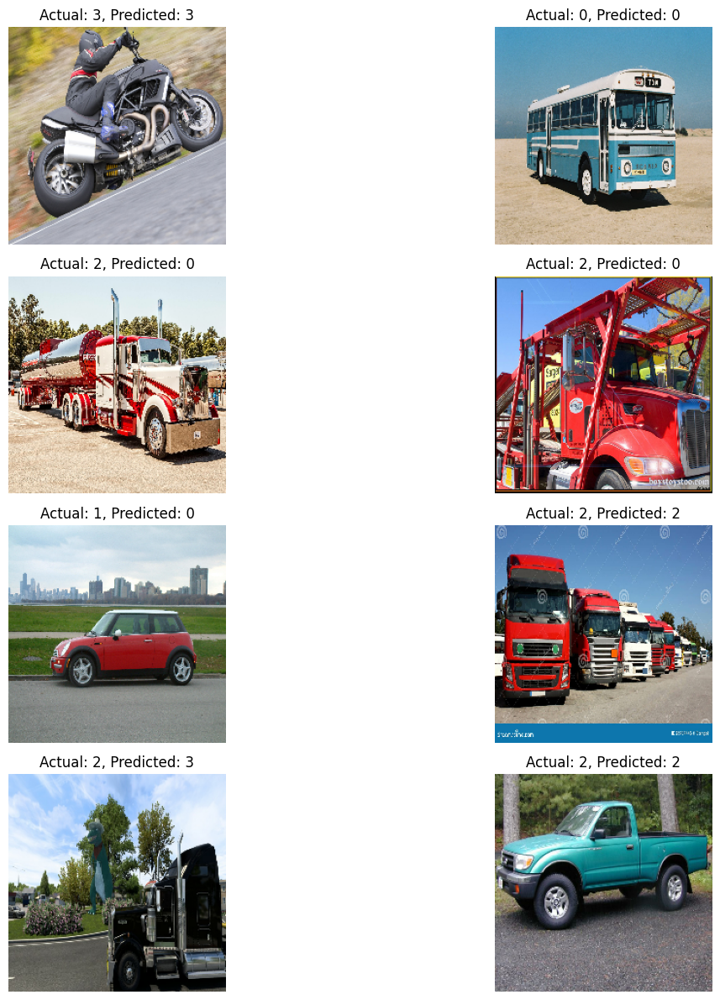

In [ ]:
plot_actual_vs_predicted(model, val_ds, num_images=8)

### ***Train MobileNetV2***
-
MobileNetV2 is a convolutional neural network architecture designed for efficient computation on mobile and embedded devices. It was introduced by Google researchers in the paper "MobileNetV2: Inverted Residuals and Linear Bottlenecks" in 2018. MobileNetV2 builds upon the success of the original MobileNet architecture, aiming to improve performance while maintaining low latency and small model size.

In [ ]:
from tensorflow.keras.applications import MobileNetV2

# Load pre-trained
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

base_model.trainable = False

# Create a new model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dropout(0.5),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')
])

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer,
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])



9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
# Train the model
history = model.fit(train_ds,
                    epochs=20,
                    batch_size=64,
                    validation_data=val_ds)



Epoch 1/20
9/9 [==============================] - 13s 577ms/step - loss: 1.9686 - accuracy: 0.3500 - val_loss: 1.1215 - val_accuracy: 0.4833
Epoch 2/20
9/9 [==============================] - 7s 276ms/step - loss: 1.5370 - accuracy: 0.4750 - val_loss: 0.9037 - val_accuracy: 0.6083
Epoch 3/20
9/9 [==============================] - 8s 283ms/step - loss: 1.0760 - accuracy: 0.5786 - val_loss: 0.7673 - val_accuracy: 0.6917
Epoch 4/20
9/9 [==============================] - 6s 271ms/step - loss: 0.9597 - accuracy: 0.6071 - val_loss: 0.7880 - val_accuracy: 0.7167
Epoch 5/20
9/9 [==============================] - 6s 270ms/step - loss: 0.9585 - accuracy: 0.6393 - val_loss: 0.8211 - val_accuracy: 0.6500
Epoch 6/20
9/9 [==============================] - 7s 274ms/step - loss: 0.7983 - accuracy: 0.6393 - val_loss: 0.7880 - val_accuracy: 0.6667
Epoch 7/20
9/9 [==============================] - 8s 409ms/step - loss: 0.7347 - accuracy: 0.7321 - val_loss: 0.7143 - val_accuracy: 0.7333
Epoch 8/20
9/9 [===

#### ***Accuracy***

In [ ]:
# Evaluate the model on the validation dataset
test_loss, test_accuracy = model.evaluate(val_ds)

# Print the test accuracy
print("Test Accuracy:", test_accuracy)



4/4 [==============================] - 2s 52ms/step - loss: 0.7637 - accuracy: 0.7000
Test Accuracy: 0.699999988079071


#### ***Plot the accuracies and losses***

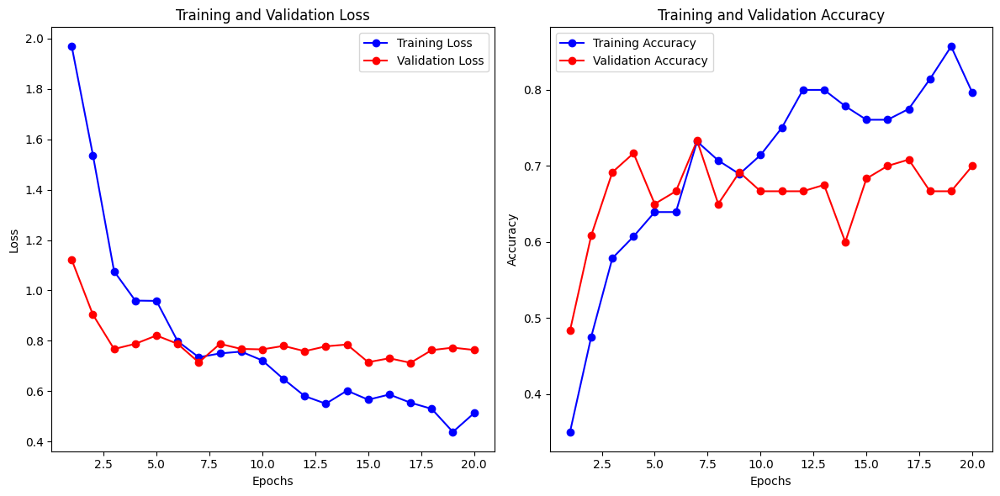

In [ ]:
# Plot training history
import matplotlib.pyplot as plt

train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


#### ***Confusion Matrix***




1/1 [==============================] - 1s 1s/step


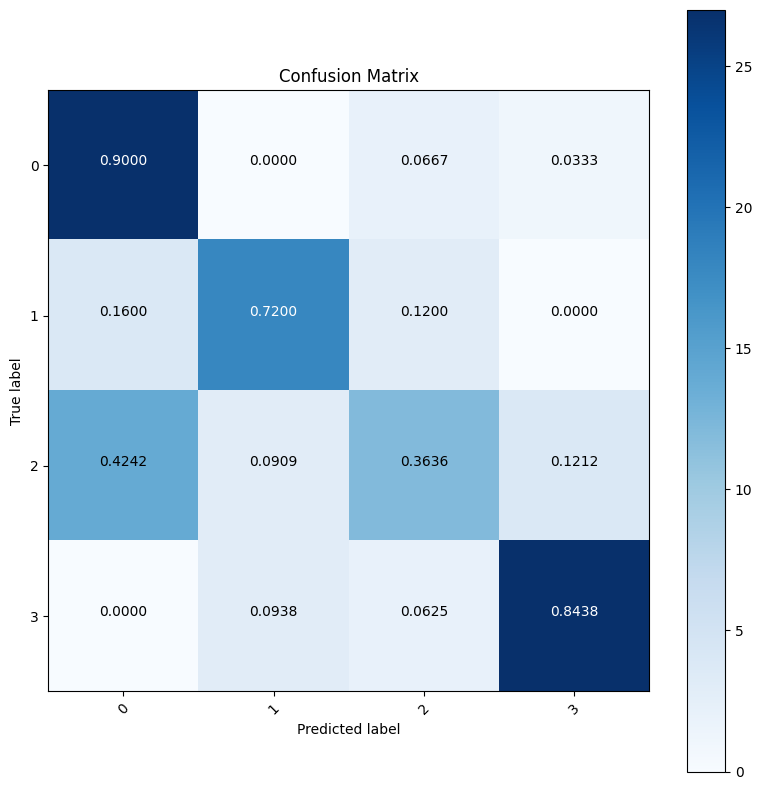

In [ ]:

true_labels = []
predicted_labels = []

for images, labels in val_ds:
    predictions = model.predict(images)
    predicted_labels.extend(np.argmax(predictions, axis=1))
    true_labels.extend(labels.numpy())

cm = confusion_matrix(true_labels, predicted_labels)

classes = unique_labels(true_labels, predicted_labels)

plt.figure(figsize=(8, 8))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, "{:0.4f}".format(cm_normalized[i, j]),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > 0.5 else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

#### ***Qualitative***

In [ ]:

# Function to plot actual and predicted images
def plot_actual_vs_predicted(model, dataset, num_images=5, images_per_row=2):
    num_rows = int(np.ceil(num_images / images_per_row))
    plt.figure(figsize=(15, 3 * num_rows))
    for i, (images, labels) in enumerate(dataset.take(num_images)):
        predictions = model.predict(images)
        predicted_labels = np.argmax(predictions, axis=1)

        for j in range(len(images)):
            if i * images_per_row + j + 1 > num_images:
                break
            plt.subplot(num_rows, images_per_row, i * images_per_row + j + 1)
            plt.imshow(images[j].numpy().astype("uint8"))
            plt.title(f"Actual: {labels[j]}, Predicted: {predicted_labels[j]}")
            plt.axis('off')
    plt.tight_layout()
    plt.show()


1/1 [==============================] - 0s 32ms/step


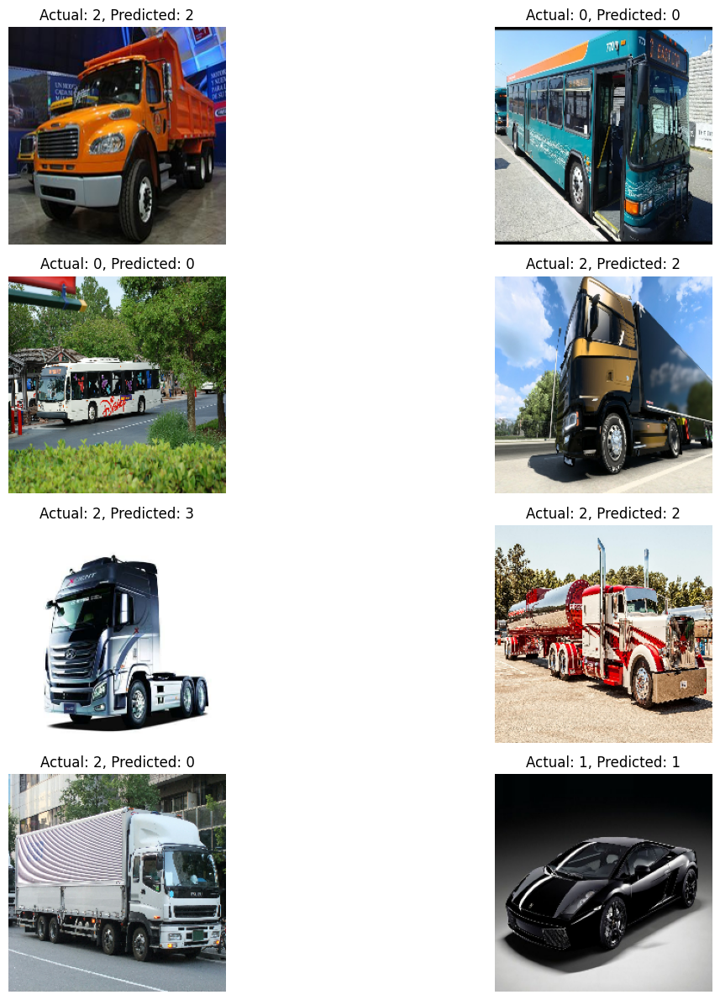

In [ ]:
plot_actual_vs_predicted(model, val_ds, num_images=8)

### ***Train ResNet50***
- **ResNet50** is a deep convolutional neural network architecture that belongs to the family of Residual Networks (ResNets). It was introduced by Microsoft Research in their paper "Deep Residual Learning for Image Recognition" in 2015.

In [ ]:
from tensorflow.keras.applications import ResNet50

# Load pre-trained
base_model = ResNet50(include_top=False, weights='imagenet')

base_model.trainable = False

# Create a new model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dropout(0.5),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')
])

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer,
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])


94765736/94765736 [==============================] - 1s 0us/step


In [ ]:
# Train the model
history = model.fit(train_ds,
                    epochs=20,
                    batch_size=32,
                    validation_data=val_ds)


Epoch 1/20
9/9 [==============================] - 19s 848ms/step - loss: 1.3618 - accuracy: 0.6071 - val_loss: 0.2499 - val_accuracy: 0.9083
Epoch 2/20
9/9 [==============================] - 8s 365ms/step - loss: 0.4550 - accuracy: 0.8464 - val_loss: 0.1856 - val_accuracy: 0.9167
Epoch 3/20
9/9 [==============================] - 9s 353ms/step - loss: 0.2777 - accuracy: 0.8964 - val_loss: 0.1854 - val_accuracy: 0.9333
Epoch 4/20
9/9 [==============================] - 8s 497ms/step - loss: 0.2513 - accuracy: 0.9250 - val_loss: 0.1553 - val_accuracy: 0.9167
Epoch 5/20
9/9 [==============================] - 7s 352ms/step - loss: 0.0903 - accuracy: 0.9643 - val_loss: 0.1521 - val_accuracy: 0.9417
Epoch 6/20
9/9 [==============================] - 7s 353ms/step - loss: 0.1154 - accuracy: 0.9500 - val_loss: 0.1475 - val_accuracy: 0.9417
Epoch 7/20
9/9 [==============================] - 8s 394ms/step - loss: 0.0465 - accuracy: 0.9893 - val_loss: 0.1494 - val_accuracy: 0.9667
Epoch 8/20
9/9 [===

#### ***Accuracy***

In [ ]:

# Evaluate the model on the validation dataset
test_loss, test_accuracy = model.evaluate(val_ds)

# Print the test accuracy
print("Test Accuracy:", test_accuracy)



4/4 [==============================] - 2s 103ms/step - loss: 0.1830 - accuracy: 0.9250
Test Accuracy: 0.925000011920929


#### ***Plot the accuracies and losses***

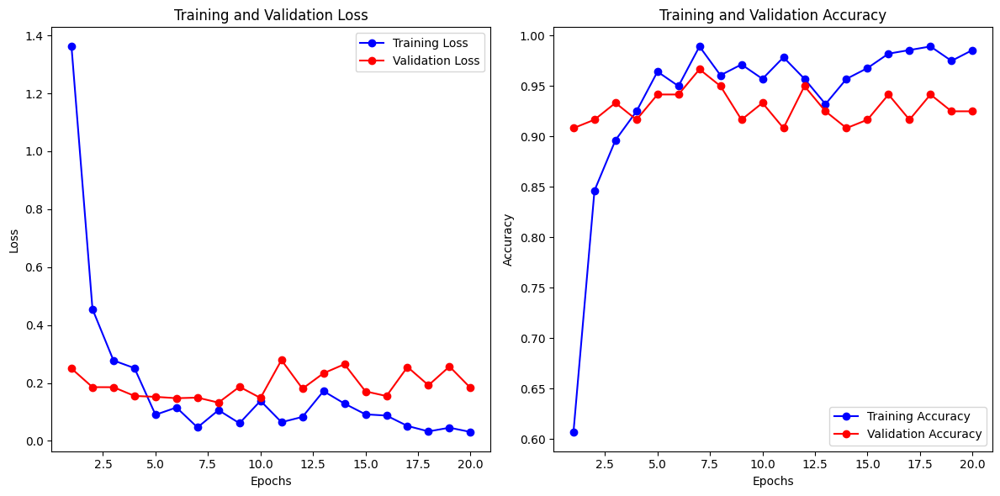

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


#### ***Confusion Matrix***

1/1 [==============================] - 1s 961ms/step


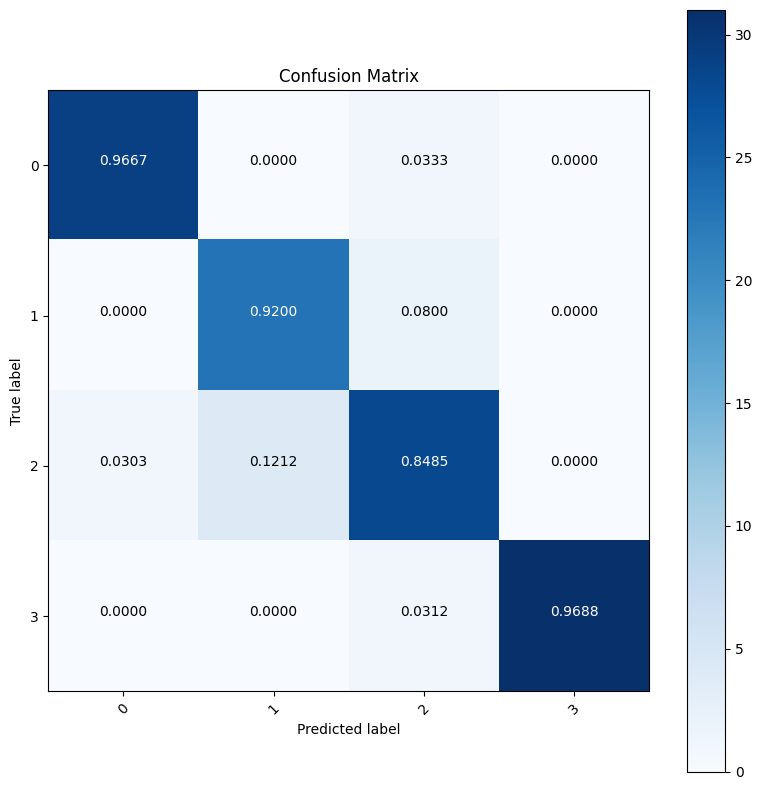

In [ ]:

true_labels = []
predicted_labels = []

for images, labels in val_ds:
    predictions = model.predict(images)
    predicted_labels.extend(np.argmax(predictions, axis=1))
    true_labels.extend(labels.numpy())

cm = confusion_matrix(true_labels, predicted_labels)

classes = unique_labels(true_labels, predicted_labels)

plt.figure(figsize=(8, 8))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, "{:0.4f}".format(cm_normalized[i, j]),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > 0.5 else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

#### ***Qualitative***

In [ ]:

# Function to plot actual and predicted images
def plot_actual_vs_predicted(model, dataset, num_images=5, images_per_row=2):
    num_rows = int(np.ceil(num_images / images_per_row))
    plt.figure(figsize=(15, 3 * num_rows))
    for i, (images, labels) in enumerate(dataset.take(num_images)):
        predictions = model.predict(images)
        predicted_labels = np.argmax(predictions, axis=1)

        for j in range(len(images)):
            if i * images_per_row + j + 1 > num_images:
                break
            plt.subplot(num_rows, images_per_row, i * images_per_row + j + 1)
            plt.imshow(images[j].numpy().astype("uint8"))
            plt.title(f"Actual: {labels[j]}, Predicted: {predicted_labels[j]}")
            plt.axis('off')
    plt.tight_layout()
    plt.show()


1/1 [==============================] - 0s 32ms/step


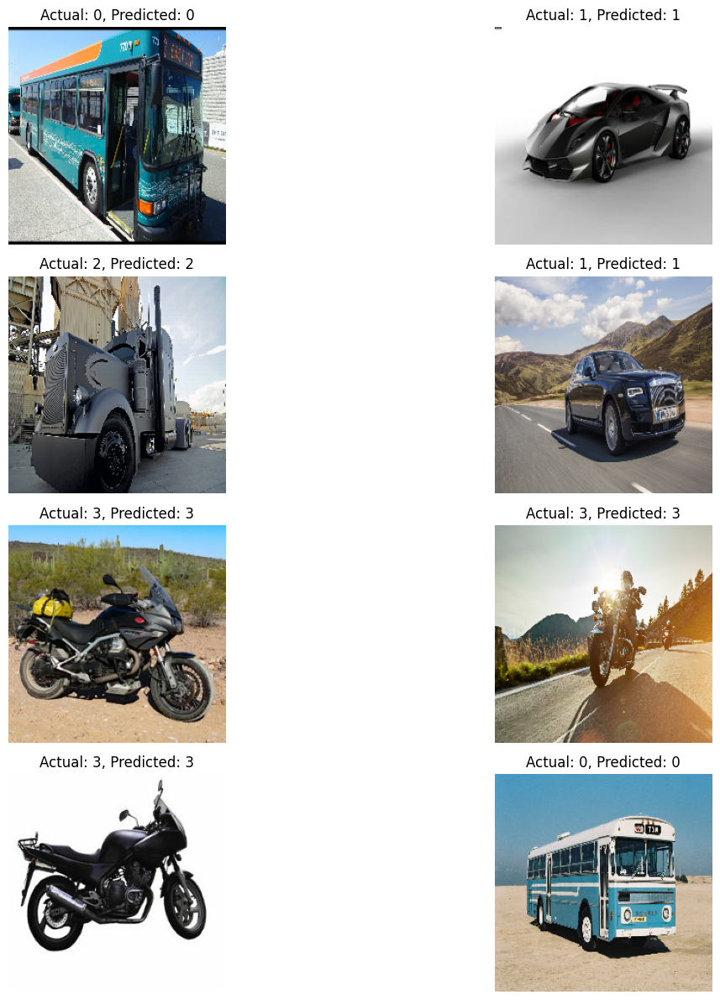

In [ ]:
plot_actual_vs_predicted(model, val_ds, num_images=8)

### ***Fine-Tune ResNet101***
- **ResNet101** is an extension of the ResNet architecture, specifically ResNet50. It is a deeper variant designed to capture more intricate features and further improve performance of image classification tasks.

In [ ]:
from tensorflow.keras.applications import ResNet101

# Load the ResNet-101 model pre-trained on ImageNet data
base_model = ResNet101(include_top=False, weights='imagenet')

# Fine-tune the last few layers of the base ResNet-101 model
for layer in base_model.layers[:-10]:
    layer.trainable = False

# Create a new model on top of the ResNet-101 base
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dropout(0.8),  # Add dropout for regularization
    Dense(512, activation='relu'),
    Dropout(0.8),  # Add dropout for regularization
    Dense(4, activation='softmax')
])


# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer,
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])


In [ ]:
# Train the model
history = model.fit(train_ds,
                    epochs=20,
                    batch_size=32,
                    validation_data=val_ds)

Epoch 1/20
9/9 [==============================] - 18s 677ms/step - loss: 4.0802 - accuracy: 0.3571 - val_loss: 1.1581 - val_accuracy: 0.8250
Epoch 2/20
9/9 [==============================] - 10s 553ms/step - loss: 1.6894 - accuracy: 0.6214 - val_loss: 1.7589 - val_accuracy: 0.8750
Epoch 3/20
9/9 [==============================] - 9s 504ms/step - loss: 0.8766 - accuracy: 0.7607 - val_loss: 2.8049 - val_accuracy: 0.8917
Epoch 4/20
9/9 [==============================] - 8s 445ms/step - loss: 0.5430 - accuracy: 0.8429 - val_loss: 2.3384 - val_accuracy: 0.8917
Epoch 5/20
9/9 [==============================] - 8s 446ms/step - loss: 0.5367 - accuracy: 0.8714 - val_loss: 0.8411 - val_accuracy: 0.9500
Epoch 6/20
9/9 [==============================] - 9s 447ms/step - loss: 0.2002 - accuracy: 0.9250 - val_loss: 1.4366 - val_accuracy: 0.9250
Epoch 7/20
9/9 [==============================] - 9s 596ms/step - loss: 0.1650 - accuracy: 0.9357 - val_loss: 1.3447 - val_accuracy: 0.9250
Epoch 8/20
9/9 [==

#### ***Accuracy***

In [ ]:
# Evaluate the model on the validation dataset
test_loss, test_accuracy = model.evaluate(val_ds)

# Print the test accuracy
print("Test Accuracy:", test_accuracy)



4/4 [==============================] - 2s 154ms/step - loss: 0.5985 - accuracy: 0.9333
Test Accuracy: 0.9333333373069763


#### ***Plot the accuracies and losses***

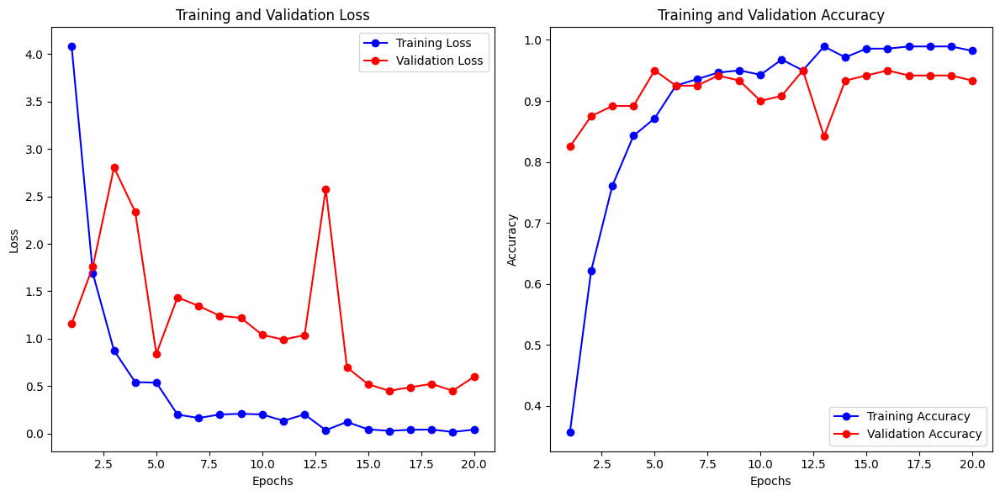

In [ ]:
# Plot training history
import matplotlib.pyplot as plt

train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

#### ***Confusion Matrix***

1/1 [==============================] - 2s 2s/step


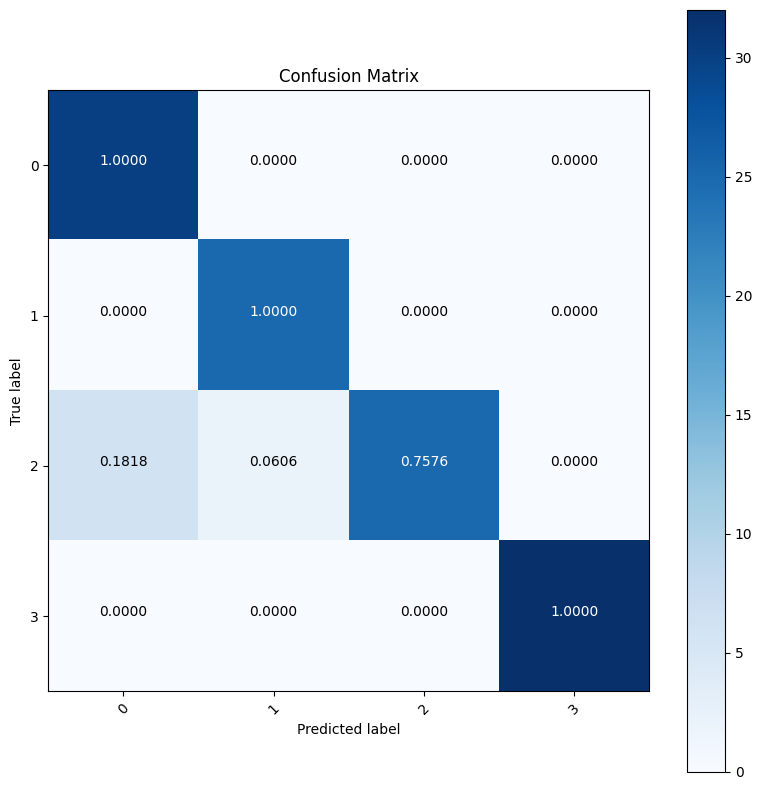

In [ ]:
true_labels = []
predicted_labels = []

for images, labels in val_ds:
    predictions = model.predict(images)
    predicted_labels.extend(np.argmax(predictions, axis=1))
    true_labels.extend(labels.numpy())

cm = confusion_matrix(true_labels, predicted_labels)

classes = unique_labels(true_labels, predicted_labels)

plt.figure(figsize=(8, 8))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, "{:0.4f}".format(cm_normalized[i, j]),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > 0.5 else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


#### ***Qualitative***

In [ ]:

# Function to plot actual and predicted images
def plot_actual_vs_predicted(model, dataset, num_images=5, images_per_row=2):
    num_rows = int(np.ceil(num_images / images_per_row))
    plt.figure(figsize=(15, 3 * num_rows))
    for i, (images, labels) in enumerate(dataset.take(num_images)):
        predictions = model.predict(images)
        predicted_labels = np.argmax(predictions, axis=1)

        for j in range(len(images)):
            if i * images_per_row + j + 1 > num_images:
                break
            plt.subplot(num_rows, images_per_row, i * images_per_row + j + 1)
            plt.imshow(images[j].numpy().astype("uint8"))
            plt.title(f"Actual: {labels[j]}, Predicted: {predicted_labels[j]}")
            plt.axis('off')
    plt.tight_layout()
    plt.show()


1/1 [==============================] - 0s 55ms/step


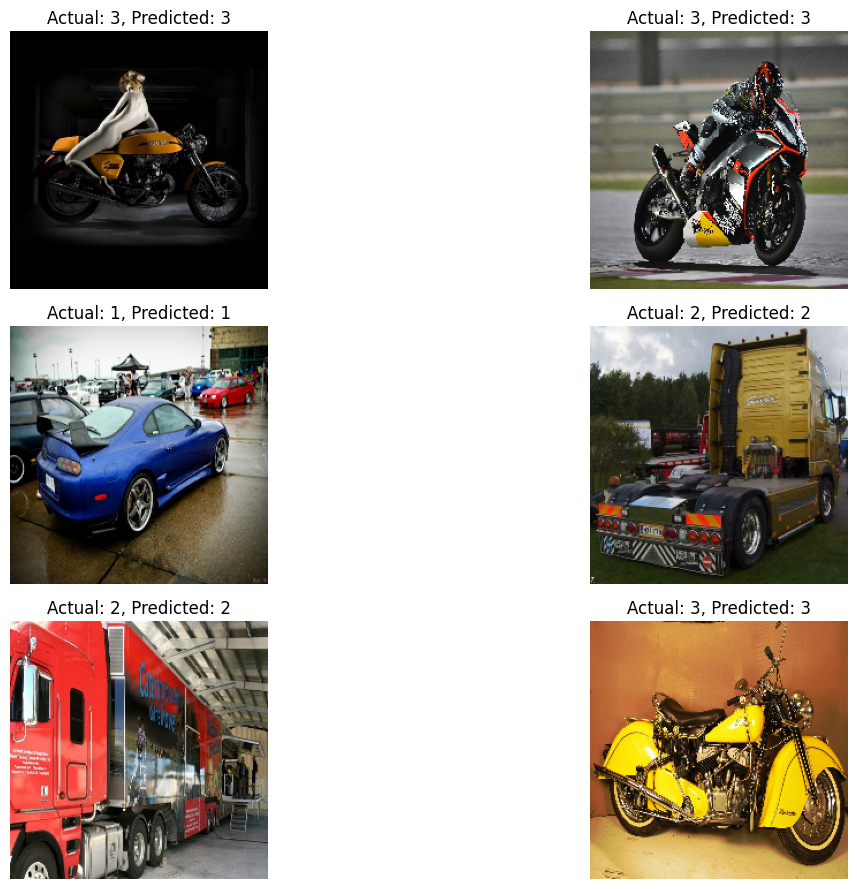

In [ ]:
plot_actual_vs_predicted(model, val_ds, num_images=6)

## ***Pre-trained Self-supervision model***

### ***Import packages***

In [ ]:
from transformers import ViTImageProcessor, AutoFeatureExtractor, AutoImageProcessor
from transformers import ResNetForImageClassification, AutoModelForImageClassification, ViTForImageClassification

import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
from PIL import Image

### ***Load Synthetic Images***
### **Dataset**
-
For the pre-trained self-supervision model, I generated a **synthetic dataset** using a **DALL-E 3**. This synthetic dataset comprises various images, including astronauts, thrones, and cars.

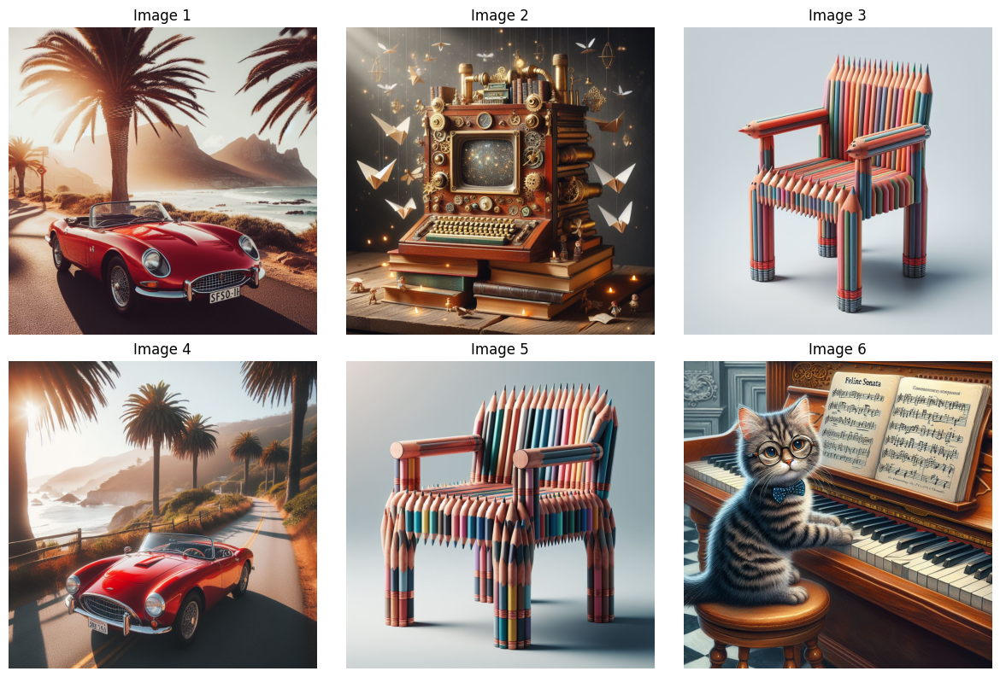

In [23]:
synthetic_data_path = "/content/drive/MyDrive/synthetic data"

image_files = os.listdir(synthetic_data_path)
random_images = random.sample(image_files, 6)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

for i, ax in enumerate(axes.flat):
    if i < len(random_images):
        image_path = os.path.join(synthetic_data_path, random_images[i])
        image = mpimg.imread(image_path)
        ax.imshow(image)
        ax.set_title("Image {}".format(i+1))
        ax.axis("off")

plt.tight_layout()
plt.show()


### ***ViT-base-patch***

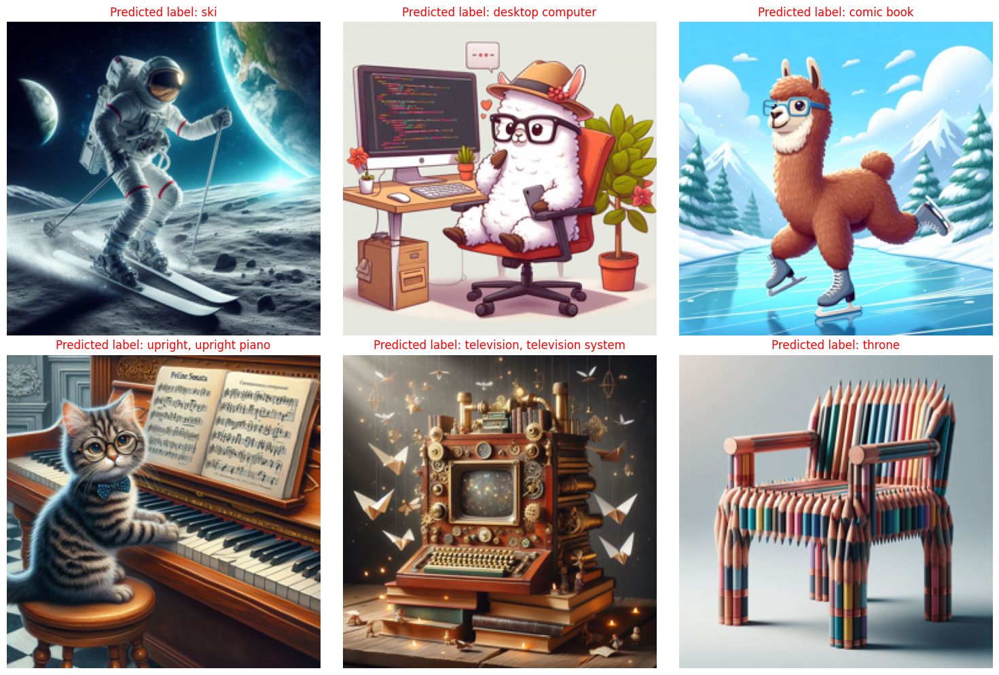

In [24]:
# Load the ViT model
processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')

# image path
image_files = os.listdir(synthetic_data_path)
# Select Random images
selected_images = random.sample(image_files, 6)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i, img_file in enumerate(selected_images):
    # Load image
    img_path = os.path.join(synthetic_data_path, img_file)
    image = Image.open(img_path)
    image = image.resize((256, 256))

    # Processor
    inputs = processor(images=image, return_tensors="pt")
    outputs = model(**inputs)
    logits = outputs.logits

    # predicted class index
    predicted_class_idx = logits.argmax(-1).item()
    predicted_label = model.config.id2label[predicted_class_idx]

    np_image = np.array(image)

    # Plot the images
    row = i // 3
    col = i % 3
    axes[row, col].imshow(np_image)
    axes[row, col].axis('off')
    axes[row, col].set_title(f'Predicted label: {predicted_label}', fontsize=12, color='red')

plt.tight_layout()
plt.show()


### ***Data-efficient image Transformer (DeiT)***
- **DeiT** is a transformer-based model designed for image classification tasks. It achieve strong performance on image classification tasks while being more data-efficient compared to traditional convolutional neural networks (CNNs).

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


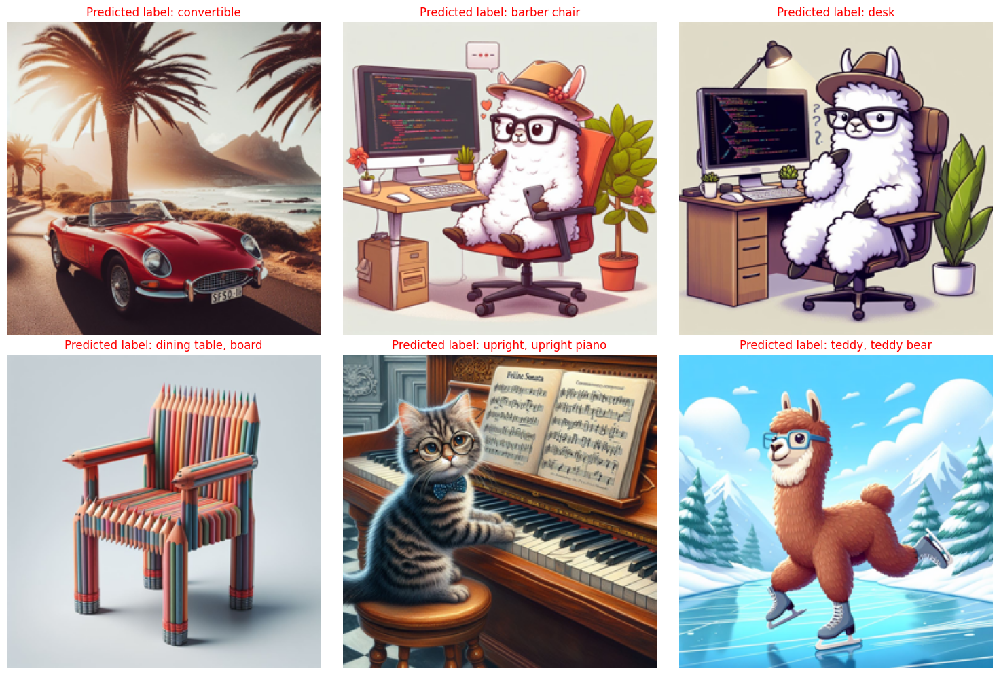

In [25]:
# Load the ViT model
feature_extractor = AutoFeatureExtractor.from_pretrained('facebook/deit-tiny-patch16-224')
model = ViTForImageClassification.from_pretrained('facebook/deit-tiny-patch16-224')


# images path
image_files = os.listdir(synthetic_data_path)
# Select Random images
selected_images = random.sample(image_files, 6)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i, img_file in enumerate(selected_images):
    # Load image
    img_path = os.path.join(synthetic_data_path, img_file)
    image = Image.open(img_path)
    image = image.resize((256, 256))

    # feature extractor
    inputs = feature_extractor(images=image, return_tensors="pt")
    outputs = model(**inputs)
    logits = outputs.logits

    # predicted class index
    predicted_class_idx = logits.argmax(-1).item()
    predicted_label = model.config.id2label[predicted_class_idx]

    np_image = np.array(image)

    # Plot the images
    row = i // 3
    col = i % 3
    axes[row, col].imshow(np_image)
    axes[row, col].axis('off')
    axes[row, col].set_title(f'Predicted label: {predicted_label}', fontsize=12, color='red')

plt.tight_layout()
plt.show()


### ***DINOv2***
- DINOv2-large-imagenet1k is a state-of-the-art self-supervised learning model for large-scale image classification tasks. It shows the effectiveness of ViT-based architectures in learning visual representations from unlabeled data.

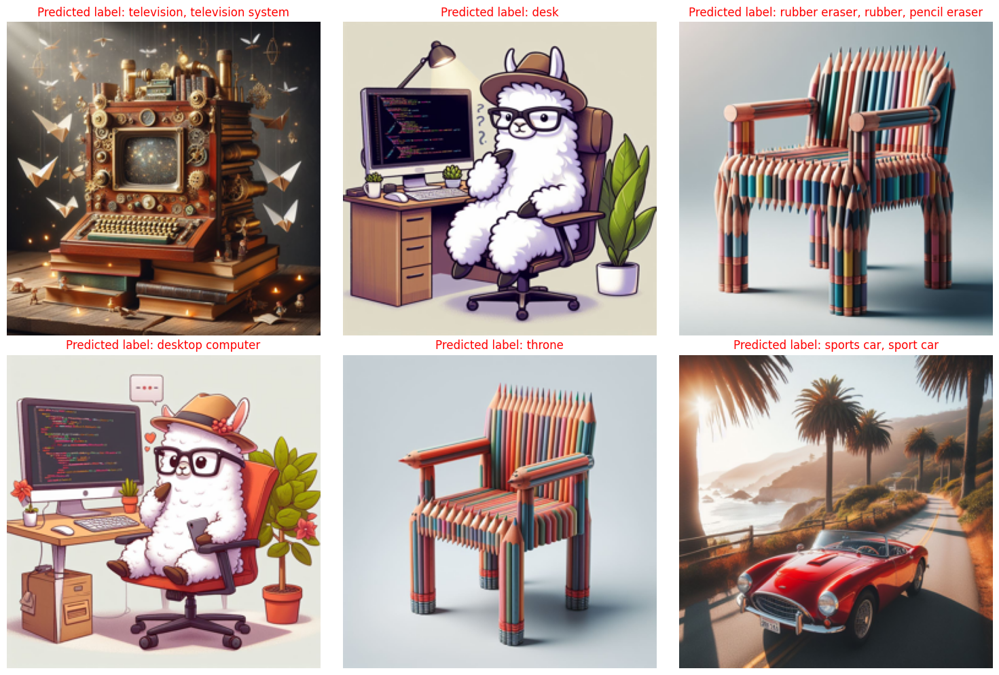

In [26]:
# Load the ViT model
processor = AutoImageProcessor.from_pretrained('facebook/dinov2-large-imagenet1k-1-layer')
model = AutoModelForImageClassification.from_pretrained('facebook/dinov2-large-imagenet1k-1-layer')

# image path
image_files = os.listdir(synthetic_data_path)
# Select Random images
selected_images = random.sample(image_files, 6)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i, img_file in enumerate(selected_images):
    # Load image
    img_path = os.path.join(synthetic_data_path, img_file)
    image = Image.open(img_path)
    image = image.resize((256, 256))

    # Processor
    inputs = processor(images=image, return_tensors="pt")
    outputs = model(**inputs)
    logits = outputs.logits

    # predicted class index
    predicted_class_idx = logits.argmax(-1).item()
    predicted_label = model.config.id2label[predicted_class_idx]

    np_image = np.array(image)

    # Plot the images
    row = i // 3
    col = i % 3
    axes[row, col].imshow(np_image)
    axes[row, col].axis('off')
    axes[row, col].set_title(f'Predicted label: {predicted_label}', fontsize=12, color='red')

plt.tight_layout()
plt.show()
